# Compare the original predicio data with pickwell
1st of Oct 2019.

In [1]:
%load_ext autoreload
%autoreload 2
%cd D:\mobi-social-segregation-se

D:\mobi-social-segregation-se


In [2]:
# Load libs
import pandas as pd
from tqdm import tqdm
import os
import numpy as np
import utm
import time
from infostop import Infostop
from lib import preprocess as preprocess
import matplotlib.pyplot as plt
import folium
import seaborn as sns

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [32]:
# infostop function
R1, R2, MIN_STAY, MAX_TIME_BETWEEN = 30, 30, 15, 12  # meters, meters, minutes, hours
def infostop_per_user(data):
    model = Infostop(
        r1=R1,
        r2=R2,
        label_singleton=True,
        min_staying_time=MIN_STAY*60,
        max_time_between=MAX_TIME_BETWEEN*60*60,
        min_size=2,
        min_spacial_resolution=0,
        distance_metric='haversine',
        weighted=False,
        weight_exponent=1,
        verbose=False,)
    x = data.loc[~(((data['latitude'] > 84) | (data['latitude'] < -80)) | ((data['longitude'] > 180) | (data['longitude'] < -180))), :]
    x = x.sort_values(by='timestamp').drop_duplicates(subset=['latitude','longitude','timestamp']).reset_index(drop=True)
    x = x.dropna()
    ##THE THING RECORDS A POINT EVERYTIME THE ACCELEROMETER REGISTER A CHANGE, SO ASSUME NO MOVE UP TO 12 hours
    x['t_seg'] = x['timestamp'].shift(-1)
    x.loc[x.index[-1],'t_seg'] = x.loc[x.index[-1],'timestamp']+1
    x['n'] = x.apply(lambda x: range(int(x['timestamp']),
                                     min(int(x['t_seg']), x['timestamp']+(MAX_TIME_BETWEEN*60*60)),
                                     (MAX_TIME_BETWEEN*60*60-1)),axis=1)
    x = x.explode('n')
    x['timestamp'] = x['n'].astype(float)
    x = x[['latitude','longitude','timestamp']].dropna() # ,'timezone'

    try:
        labels = model.fit_predict(x[['latitude','longitude','timestamp']].values)
    except:
        return pd.DataFrame([],columns=['device_aid','timestamp','latitude','longitude','loc','stop_latitude','stop_longitude','interval']) #,'timezone'

    label_medians = model.compute_label_medians()
    x['loc'] = labels
    x['same_loc'] = x['loc']==x['loc'].shift()
    # x['same_timezone'] = x['timezone']==x['timezone'].shift()
    x['little_time'] = (x['timestamp'] - x['timestamp'].shift() < MAX_TIME_BETWEEN*60*60)

    x['interval'] = (~( x['same_loc'] &
                        x['little_time'])).cumsum() # & x['same_timezone']

    latitudes = {k:v[0] for k,v in label_medians.items()}
    longitudes = {k:v[1] for k,v in label_medians.items()}
    x['stop_latitude'] = x['loc'].map(latitudes)
    x['stop_longitude'] = x['loc'].map(longitudes)
    x['device_aid'] = data['device_aid'].values[0]

    #keep only stop locations
    x = x[x['loc']>0].copy()

    return x[['device_aid','timestamp','latitude','longitude','loc','stop_latitude','stop_longitude','interval']] #,'timezone'

In [3]:
df_pi = pd.read_parquet('D:\\MAD_dbs\\data_comparison\\pickwell.parquet')
df_pr = pd.read_parquet('D:\\MAD_dbs\\data_comparison\\predicio.parquet')

- **Observation 1. Pickwell data have 3 times as many unique device IDs as Predicio.**

In [6]:
# Number of unique devices
df_pr.device_aid.nunique(), df_pi.device_aid.nunique()

(98242, 343661)

In [10]:
devices = list(set(df_pr.device_aid.unique()) & set(df_pi.device_aid.unique()))
len(devices)

98242

- **Observation 2. With the same 10,000 devices, Pickwell data are slightly longer than Predicio.**

## 0. Data length

In [11]:
devices = devices[:10000]

In [12]:
df_pi = df_pi.loc[df_pi.device_aid.isin(devices), :]
df_pr = df_pr.loc[df_pr.device_aid.isin(devices), :]
len(df_pr), len(df_pi)

(1101176, 1340078)

In [39]:
df_devices = pd.merge(
    df_pi.groupby('device_aid').\
    agg(size_pi=('timestamp', 'count')).\
    sort_values(by='size_pi', ascending=False).\
    reset_index(),
    df_pr.groupby('device_aid').\
    agg(size_pr=('timestamp', 'count')).\
    sort_values(by='size_pr', ascending=False).\
    reset_index(),
    on='device_aid'
)
df_devices.head()

,device_aid,size_pi,size_pr
0,e3081f61-e39c-42ec-b9a2-c6a88ff49251,6621,1098
1,8e5d4036-808c-47f4-855b-a3269be1c379,4563,1333
2,56093136-8048-44bf-821a-2558fb518167,3721,1295
3,66048e6b-d4cc-45f1-baf4-f19b5f2204bc,3628,1460
4,625b67a7-6bdf-444d-a438-6ca14e3d2446,3587,729


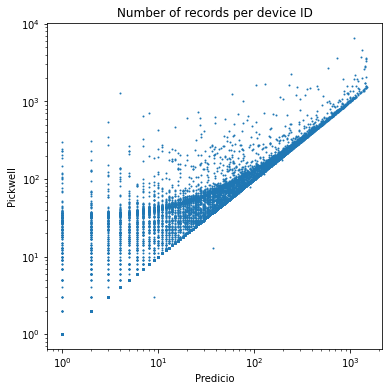

In [45]:
fig, ax = plt.subplots(figsize=(6, 6))
plt.scatter(x=df_devices['size_pr'], y=df_devices['size_pi'], s=1)
plt.xscale('log')
plt.yscale('log')
plt.xlabel("Predicio")
plt.ylabel("Pickwell")
plt.title('Number of records per device ID')
plt.show()

## 1. Check data statistics

In [14]:
# Compute the statistics
def delta_stats(data):
    x = data.loc[~(((data['latitude'] > 84) | (data['latitude'] < -80)) | ((data['longitude'] > 180) | (data['longitude'] < -180))), :]
    x = x.sort_values(by='timestamp')
    for var, var_name in zip(('utm_x', 'utm_y', 'timestamp'), ('xDelta', 'yDelta', 'tDelta')):
        x.loc[:, var_name] = x.loc[:, var].diff()
    x = x[['device_aid', 'timestamp', 'xDelta', 'yDelta', 'tDelta']].dropna()
    x.loc[:, 'displacement'] = (x.loc[:, 'xDelta']**2 + x.loc[:, 'yDelta']**2)**0.5
    return x
## Find delta stats
tqdm.pandas()
df_pi_delta = df_pi.groupby('device_aid').progress_apply(delta_stats).reset_index(drop=True)
df_pi_delta.head(5)

100%|██████████| 10000/10000 [01:05<00:00, 152.61it/s]


,device_aid,timestamp,xDelta,yDelta,tDelta,displacement
0,00026955-d574-4b3b-a263-67ec5c1cc7c3,1569922407,0.0,0.0,19.0,0.0
1,00026955-d574-4b3b-a263-67ec5c1cc7c3,1569922425,0.0,0.0,18.0,0.0
2,00026955-d574-4b3b-a263-67ec5c1cc7c3,1569922445,0.0,0.0,20.0,0.0
3,00026955-d574-4b3b-a263-67ec5c1cc7c3,1569922580,0.0,0.0,135.0,0.0
4,00026955-d574-4b3b-a263-67ec5c1cc7c3,1569922598,0.0,0.0,18.0,0.0


In [15]:
## Find delta stats
tqdm.pandas()
df_pr_delta = df_pr.groupby('device_aid').progress_apply(delta_stats).reset_index(drop=True)
df_pr_delta.head(5)

100%|██████████| 10000/10000 [01:04<00:00, 154.74it/s]


,device_aid,timestamp,xDelta,yDelta,tDelta,displacement
0,00026955-d574-4b3b-a263-67ec5c1cc7c3,1569922407,0.0,0.0,19.0,0.0
1,00026955-d574-4b3b-a263-67ec5c1cc7c3,1569922425,0.0,0.0,18.0,0.0
2,00026955-d574-4b3b-a263-67ec5c1cc7c3,1569922445,0.0,0.0,20.0,0.0
3,00026955-d574-4b3b-a263-67ec5c1cc7c3,1569922580,0.0,0.0,135.0,0.0
4,00026955-d574-4b3b-a263-67ec5c1cc7c3,1569922598,0.0,0.0,18.0,0.0


- **Observation 3. Pickwell data have similar distributions of delta T and displacement as Predicio, but with slightly more longer displacements > 100 km.**

### 1.1 Distribution of delta T

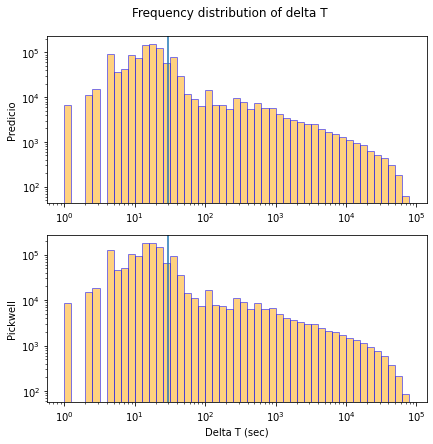

In [28]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(6, 6))
fig.suptitle('Frequency distribution of delta T')
fig.tight_layout()
axs[0].hist(df_pr_delta.loc[df_pr_delta['tDelta'] > 0, 'tDelta'],
         bins = [10**(x/10) for x in range(0, 50)], color=['orange'], ec="blue", alpha=0.5)
axs[0].axvline(30)
axs[0].set_xscale('log')
axs[0].set_yscale('log')
axs[0].set_ylabel('Predicio')

axs[1].hist(df_pi_delta.loc[df_pi_delta['tDelta'] > 0, 'tDelta'],
         bins = [10**(x/10) for x in range(0, 50)], color=['orange'], ec="blue", alpha=0.5)
axs[1].axvline(30)
axs[1].set_xscale('log')
axs[1].set_yscale('log')
axs[1].set_xlabel('Delta T (sec)')
axs[1].set_ylabel('Pickwell')
plt.show()

### 1.2 Distribution of displacement

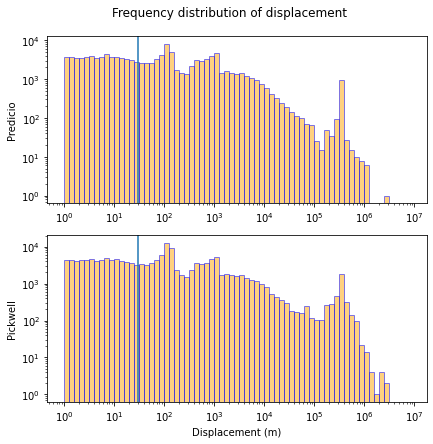

In [27]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(6, 6))
fig.suptitle('Frequency distribution of displacement')
fig.tight_layout()
axs[0].hist(df_pr_delta.loc[df_pr_delta['displacement'] > 0, 'displacement'],
         bins = [10**(x/10) for x in range(0, 70)], color=['orange'], ec="blue", alpha=0.5)
axs[0].axvline(30)
axs[0].set_xscale('log')
axs[0].set_yscale('log')
axs[0].set_ylabel('Predicio')

axs[1].hist(df_pi_delta.loc[df_pi_delta['displacement'] > 0, 'displacement'],
         bins = [10**(x/10) for x in range(0, 70)], color=['orange'], ec="blue", alpha=0.5)
axs[1].axvline(30)
axs[1].set_xscale('log')
axs[1].set_yscale('log')
axs[1].set_xlabel('Displacement (m)')
axs[1].set_ylabel('Pickwell')
plt.show()

## 2. Detect stops
- **Observation 4. Pickwell data has more trajectories data than Predicio.**
- **Observation 5. Pickwell data contains more artificial stay points than Predicio, which should be removed.**

In [36]:
tqdm.pandas()
stops_pr = df_pr.groupby('device_aid').progress_apply(infostop_per_user).reset_index(drop=True)
df_pr_stops = stops_pr.groupby(['device_aid','interval']).agg(
    loc=('loc', lambda x: x.iloc[0]),
    start=('timestamp', 'min'),
    end=('timestamp', 'max'),
    latitude=('stop_latitude', lambda x: x.iloc[0]),
    longitude=('stop_longitude', lambda x: x.iloc[0]),
    size=('loc', 'count'))
df_pr_stops.head()

100%|██████████| 10000/10000 [02:37<00:00, 63.40it/s]


loc         start  \
device_aid                           interval                      
002632d6-9b52-44ff-82ad-ebb44b8f349d 1           1  1.569905e+09   
                                     3           1  1.569956e+09   
008bd061-2910-4a30-88fa-2f27a0bbb535 3           1  1.569944e+09   
008c91de-d951-4cf6-a2f6-3e155ca8e7f4 2           2  1.569917e+09   
                                     4           2  1.569937e+09   

                                                        end   latitude  \
device_aid                           interval                            
002632d6-9b52-44ff-82ad-ebb44b8f349d 1         1.569927e+09  58.593280   
                                     3         1.569967e+09  58.593280   
008bd061-2910-4a30-88fa-2f27a0bbb535 3         1.569946e+09  59.291429   
008c91de-d951-4cf6-a2f6-3e155ca8e7f4 2         1.569933e+09  59.174949   
                                     4         1.569951e+09  59.174949   

                                               longitude  size  
device_aid                           interval                   
002632d6-9b52-44ff-82ad-ebb44b8f349d 1         16.174265    36  
                                     3         16.174265    13  
008bd061-2910-4a30-88fa-2f27a0bbb535 3         15.205516    38  
008c91de-d951-4cf6-a2f6-3e155ca8e7f4 2         14.873907    28  
                                     4         14.873907    56

In [37]:
tqdm.pandas()
stops_pi = df_pi.groupby('device_aid').progress_apply(infostop_per_user).reset_index(drop=True)
df_pi_stops = stops_pi.groupby(['device_aid','interval']).agg(
    loc=('loc', lambda x: x.iloc[0]),
    start=('timestamp', 'min'),
    end=('timestamp', 'max'),
    latitude=('stop_latitude', lambda x: x.iloc[0]),
    longitude=('stop_longitude', lambda x: x.iloc[0]),
    size=('loc', 'count'))
df_pi_stops.head()

100%|██████████| 10000/10000 [02:45<00:00, 60.41it/s]


loc         start  \
device_aid                           interval                      
002632d6-9b52-44ff-82ad-ebb44b8f349d 1           1  1.569905e+09   
                                     3           1  1.569956e+09   
008bd061-2910-4a30-88fa-2f27a0bbb535 3           1  1.569944e+09   
008c91de-d951-4cf6-a2f6-3e155ca8e7f4 2           2  1.569917e+09   
                                     4           2  1.569937e+09   

                                                        end   latitude  \
device_aid                           interval                            
002632d6-9b52-44ff-82ad-ebb44b8f349d 1         1.569927e+09  58.593280   
                                     3         1.569967e+09  58.593280   
008bd061-2910-4a30-88fa-2f27a0bbb535 3         1.569946e+09  59.291429   
008c91de-d951-4cf6-a2f6-3e155ca8e7f4 2         1.569933e+09  59.174949   
                                     4         1.569951e+09  59.174949   

                                               longitude  size  
device_aid                           interval                   
002632d6-9b52-44ff-82ad-ebb44b8f349d 1         16.174265    36  
                                     3         16.174265    13  
008bd061-2910-4a30-88fa-2f27a0bbb535 3         15.205516    38  
008c91de-d951-4cf6-a2f6-3e155ca8e7f4 2         14.873907    28  
                                     4         14.873907    56

In [46]:
df_pi_stops = df_pi_stops.reset_index()
df_pr_stops = df_pr_stops.reset_index()

### 2.1 Select one device

In [47]:
def merge_stops_and_raw(df=None, df_stops=None, device_id=None):
    df_eg = df.loc[df.device_aid==device_id,:].sort_values(by='timestamp')
    df_eg.loc[:, 'stop_id'] = 0
    df_eg_stops = df_stops.loc[df_stops['device_aid']==device_id, :].sort_values(by='start')
    df_eg_stops.loc[:, 'stop_id'] = range(1, len(df_eg_stops) + 1)
    for _, row in df_eg_stops.iterrows():
        df_eg.loc[(df_eg['timestamp'] <= row['end']) & (df_eg['timestamp'] >= row['start']), 'stop_id'] = row['stop_id']
    return df_eg

In [55]:
device = df_devices.iloc[0]['device_aid']
df_eg_pi = merge_stops_and_raw(df=df_pi, df_stops=df_pi_stops, device_id=device)
df_eg_pr = merge_stops_and_raw(df=df_pr, df_stops=df_pr_stops, device_id=device)

### 2.2 Show all records of selected device
#### 2.2.1 Pickwell

In [52]:
colors = {x:y for x, y in zip(df_eg_pi.stop_id.unique(), sns.color_palette("plasma", df_eg_pi.stop_id.nunique()).as_hex())}
map_osm = folium.Map(location=df_eg_pi[['latitude', 'longitude']].values[0])
df_eg_pi.apply(lambda row : folium.CircleMarker(location=(row["latitude"], row["longitude"]),
                                             radius=3, fill_color=colors[row['stop_id']], popup=row['stop_id'],
                                             color=colors[row['stop_id']]).add_to(map_osm), axis=1)
map_osm

#### 2.2.2 Predicio

In [53]:
colors = {x:y for x, y in zip(df_eg_pr.stop_id.unique(), sns.color_palette("plasma", df_eg_pr.stop_id.nunique()).as_hex())}
map_osm = folium.Map(location=df_eg_pr[['latitude', 'longitude']].values[0])
df_eg_pr.apply(lambda row : folium.CircleMarker(location=(row["latitude"], row["longitude"]),
                                             radius=3, fill_color=colors[row['stop_id']], popup=row['stop_id'],
                                             color=colors[row['stop_id']]).add_to(map_osm), axis=1)
map_osm

### 2.3 Select another device

In [59]:
device = "66c4dfd4-2ec8-4054-8459-f4a1c0fb1350"
df_eg_pi = merge_stops_and_raw(df=df_pi, df_stops=df_pi_stops, device_id=device)
df_eg_pr = merge_stops_and_raw(df=df_pr, df_stops=df_pr_stops, device_id=device)

### 2.4 Show only stays
#### 2.4.1 Pickwell

In [60]:
df_eg_s = df_eg_pi.loc[df_eg_pi.stop_id > 0, :]
colors = {x:y for x, y in zip(df_eg_s.stop_id.unique(), sns.color_palette("plasma", df_eg_s.stop_id.nunique()).as_hex())}
map_osm = folium.Map(location=df_eg_s[['latitude', 'longitude']].values[0], zoom_start=11)
df_eg_s.apply(lambda row : folium.CircleMarker(location=(row["latitude"], row["longitude"]),
                                             radius=3, fill_color=colors[row['stop_id']], popup=row['stop_id'],
                                             color=colors[row['stop_id']]).add_to(map_osm), axis=1)
map_osm

#### 2.4.2 Predicio

In [61]:
df_eg_s = df_eg_pr.loc[df_eg_pr.stop_id > 0, :]
colors = {x:y for x, y in zip(df_eg_s.stop_id.unique(), sns.color_palette("plasma", df_eg_s.stop_id.nunique()).as_hex())}
map_osm = folium.Map(location=df_eg_s[['latitude', 'longitude']].values[0], zoom_start=11)
df_eg_s.apply(lambda row : folium.CircleMarker(location=(row["latitude"], row["longitude"]),
                                             radius=3, fill_color=colors[row['stop_id']], popup=row['stop_id'],
                                             color=colors[row['stop_id']]).add_to(map_osm), axis=1)
map_osm

IndexError: index 0 is out of bounds for axis 0 with size 0